## UML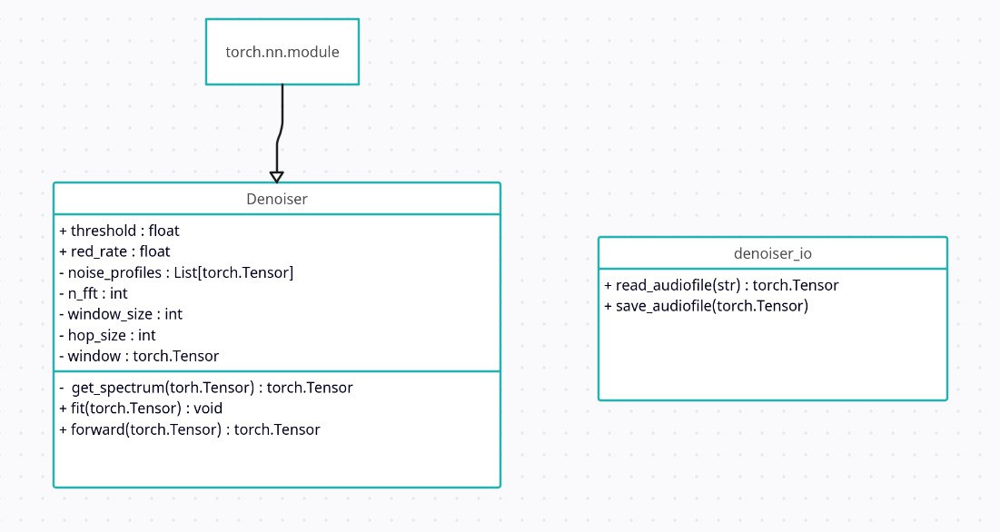

## Оценка профиля шума

Будем считать профиль шума как среднее значений амплитуды по единицам времени в спектрограмме.

Таким образом, мы сможем выделить "однородные" шумы, которые слабо меняются в течение аудиосигнала.



## Пример работы Denoiser:

In [2]:
import torch
import soundfile as sf
from denoiser.denoiser import Denoiser
from denoiser.denoiser_io import read_audiofile, save_audiofile
from IPython import display
import matplotlib.pyplot as plt
import numpy as np

In [4]:
noisy_data, sr = read_audiofile("examples/p232_003.wav")
noise, noise_sr = read_audiofile("examples/p232_003_noise.wav")

denoiser = Denoiser(threshold=0.8, red_rate=1.3)
denoiser.fit(noise)
clean_data = denoiser.forward(noisy_data)

save_audiofile("out/clean.wav", clean_data, sr)

Посмотрим на звуковые амплитуды исходной и получившейся дорожки и послушаем результат

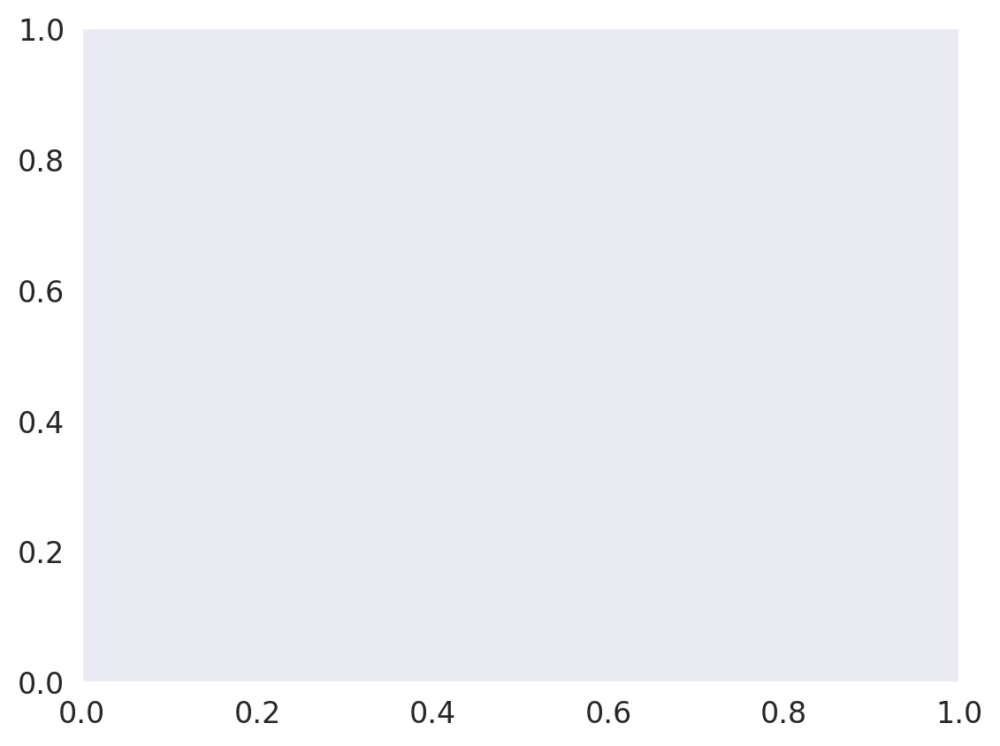

In [5]:
import seaborn as sns

%config InlineBackend.figure_format = "retina"
plt.rcParams["font.size"] = 12
plt.grid()

In [6]:
def draw_audio(audio, title, ax, sr):
    axes[i].plot(audio, alpha=.7, c='b')
    axes[i].set_title(title)
    axes[i].set_xlabel("Time")
    axes[i].set_ylabel("Amplitude")
    print(title)
    display.display(display.Audio(audio.T, rate=sr))

noisy sound


denoised sound


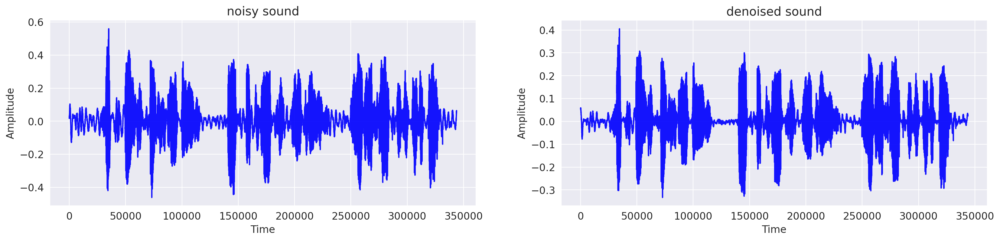

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(20, 4))

for i, data in enumerate(zip([noisy_data, clean_data], ["noisy sound", "denoised sound"])):
    draw_audio(data[0][:-1024], data[1], axes[i], sr)

Видно, что получившаяся дорожка потеряла в громкости
Попробуем ее нормализовать


In [ ]:
!pip install pyloudnorm
import pyloudnorm as pyln

In [9]:
meter = pyln.Meter(sr)
target_loudness = meter.integrated_loudness(noisy_data.numpy())
input_loudness = meter.integrated_loudness(clean_data.numpy())

normalized_clean = pyln.normalize.loudness(clean_data.numpy()[:-1024], input_loudness, target_loudness)
display.display(display.Audio(normalized_clean[:-1024].T, rate=sr))

## Посмотрим на спектрограммы:

In [10]:
def draw_spectrogramm(spectrum, ax, title=""):
    spectrogram = spectrum.norm(dim=-1).pow(2)
    ax.imshow(spectrogram.squeeze().log())

    # translate spectrogramm indices into Hz
    ax.set_yticks(
        list(range(spectrogram.shape[0])[::256]),
        (np.arange(spectrogram.shape[0]) * sr / n_fft)[::256])

    ax.set_xlabel('Time', size=15)
    ax.set_ylabel('Frequency (Hz)', size=15)
    ax.set_title(title)

/usr/local/lib/python3.10/dist-packages/torch/functional.py:650: UserWarning: stft with return_complex=False is deprecated. In a future pytorch release, stft will return complex tensors for all inputs, and return_complex=False will raise an error.
Note: you can still call torch.view_as_real on the complex output to recover the old return format. (Triggered internally at ../aten/src/ATen/native/SpectralOps.cpp:863.)
  return _VF.stft(input, n_fft, hop_length, win_length, window,  # type: ignore[attr-defined]


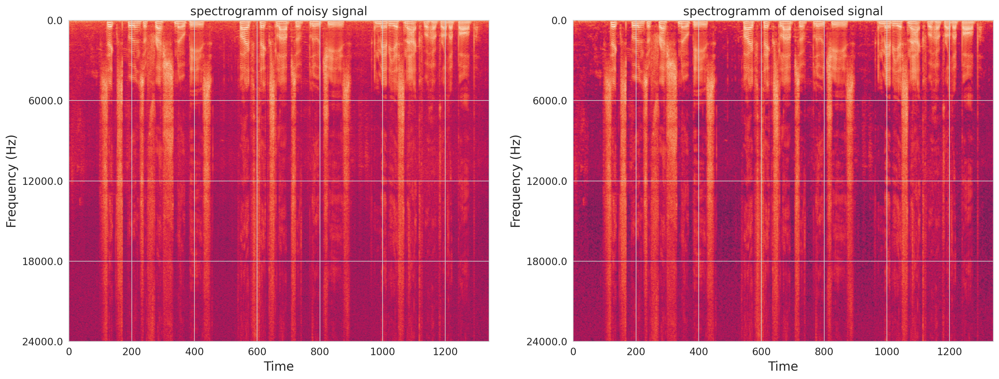

In [11]:
sns.set_style("whitegrid")

n_fft = 2048
window_size = n_fft
hop_size = 256
window = torch.hann_window(n_fft)

spectrum_noisy = torch.stft(
    noisy_data[:, 0],
    n_fft=n_fft,
    hop_length=hop_size,
    win_length=window_size,
    window=window,

    center=False,

    onesided=True,

    return_complex=False,
)

spectrum_clean = torch.stft(
    clean_data[:, 0],
    n_fft=n_fft,
    hop_length=hop_size,
    win_length=window_size,
    window=window,

    center=False,

    onesided=True,

    return_complex=False,
)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
draw_spectrogramm(spectrum_noisy, axes[0], "spectrogramm of noisy signal")
draw_spectrogramm(spectrum_clean, axes[1], "spectrogramm of denoised signal")


Кажется, сигнал стал действительно более "чистым". Яркие линии, соответсвующие голосу, на правом графике выделяются лучше, чем на левом.